In [1]:
!pip install download

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import pandas as pd
from download import download
mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

In [3]:
path = download("https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip",
                '/content/drive/My Drive/TimeSeries',kind='zip',replace=True)


file_sizes: 100%|███████████████████████████| 7.96M/7.96M [00:13<00:00, 583kB/s]
Extracting zip file...
Successfully downloaded / unzipped to /content/drive/My Drive/TimeSeries


In [4]:
df = pd.read_csv('PRSA_Data_Dingling_20130301-20170228.csv', 
                 encoding='ISO-8859-1')

In [5]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
No         35064 non-null int64
year       35064 non-null int64
month      35064 non-null int64
day        35064 non-null int64
hour       35064 non-null int64
PM2.5      34285 non-null float64
PM10       34408 non-null float64
SO2        34334 non-null float64
NO2        33830 non-null float64
CO         33052 non-null float64
O3         33850 non-null float64
TEMP       35011 non-null float64
PRES       35014 non-null float64
DEWP       35011 non-null float64
RAIN       35013 non-null float64
wd         34924 non-null object
WSPM       35021 non-null float64
station    35064 non-null object
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [7]:
def convert_to_date(x):
  return datetime.strptime(x, '%Y %m %d %H')

In [8]:
aq_data = pd.read_csv('/content/drive/My Drive/TimeSeries/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', 
                 parse_dates=[['year','month','day','hour']],date_parser=convert_to_date, keep_date_col=True)

In [9]:
aq_data.head()

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [10]:
aq_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 19 columns):
year_month_day_hour    35064 non-null datetime64[ns]
No                     35064 non-null int64
year                   35064 non-null object
month                  35064 non-null object
day                    35064 non-null object
hour                   35064 non-null object
PM2.5                  34285 non-null float64
PM10                   34408 non-null float64
SO2                    34334 non-null float64
NO2                    33830 non-null float64
CO                     33052 non-null float64
O3                     33850 non-null float64
TEMP                   35011 non-null float64
PRES                   35014 non-null float64
DEWP                   35011 non-null float64
RAIN                   35013 non-null float64
wd                     34924 non-null object
WSPM                   35021 non-null float64
station                35064 non-null object
dtypes: datetime64

In [11]:
aq_data['month'] = pd.to_numeric(aq_data['month'])

In [12]:
aq_data['month']. dtypes

dtype('int64')

In [13]:
aq_data.shape

(35064, 19)

In [14]:
aq_data.isnull().sum()

year_month_day_hour       0
No                        0
year                      0
month                     0
day                       0
hour                      0
PM2.5                   779
PM10                    656
SO2                     730
NO2                    1234
CO                     2012
O3                     1214
TEMP                     53
PRES                     50
DEWP                     53
RAIN                     51
wd                      140
WSPM                     43
station                   0
dtype: int64

In [15]:
aq_data.nunique()

year_month_day_hour    35064
No                     35064
year                       5
month                     12
day                       31
hour                      24
PM2.5                    486
PM10                     554
SO2                      327
NO2                      636
CO                       103
O3                       792
TEMP                     998
PRES                     593
DEWP                     602
RAIN                     116
wd                        16
WSPM                      95
station                    1
dtype: int64

In [16]:
aq_data.describe()

,No,month,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,6.522930,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,3.448752,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,1.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,4.000000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,7.000000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,10.000000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,12.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


In [17]:
aq_data_non_indexed = aq_data.copy()

In [18]:
aq_data = aq_data.set_index('year_month_day_hour')

In [19]:
aq_data.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [20]:
aq_data.loc['2013':'2015']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
2013-03-01 05:00:00,6,2013,3,1,5,6.0,6.0,3.0,4.0,200.0,79.0,-4.5,1022.6,-19.5,0.0,NNW,1.7,Dingling
2013-03-01 06:00:00,7,2013,3,1,6,5.0,10.0,3.0,4.0,200.0,77.0,-4.5,1023.4,-19.5,0.0,NNW,1.8,Dingling
2013-03-01 07:00:00,8,2013,3,1,7,5.0,6.0,3.0,2.0,200.0,80.0,-2.1,1024.6,-20.0,0.0,NW,2.5,Dingling
2013-03-01 08:00:00,9,2013,3,1,8,8.0,7.0,3.0,3.0,200.0,79.0,-0.2,1025.2,-20.5,0.0,NNW,2.8,Dingling


In [21]:
pm_data = aq_data['PM2.5']
pm_data.head(2)

year_month_day_hour
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    7.0
Name: PM2.5, dtype: float64

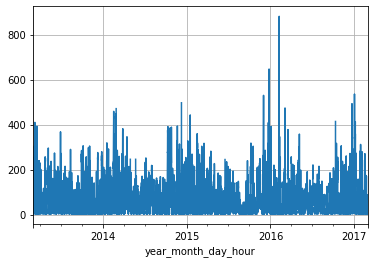

In [22]:
pm_data.plot(grid=True)

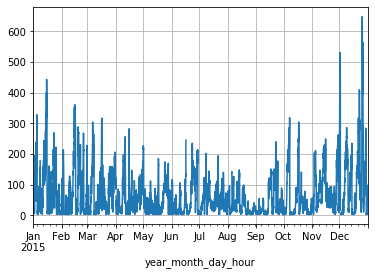

In [23]:
aq_data_2015 = aq_data.loc['2015']
pm_data_2015 = aq_data_2015['PM2.5']
pm_data_2015.plot(grid=True)

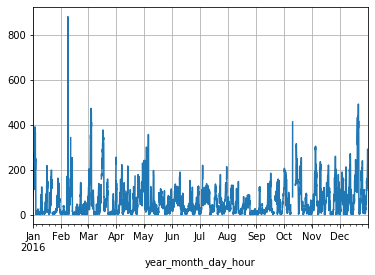

In [24]:
aq_data_2016 = aq_data.loc['2016']
pm_data_2016 = aq_data_2016['PM2.5']
pm_data_2016.plot(grid=True)

In [25]:
pip install plotly==4.8.

Note: you may need to restart the kernel to use updated packages.


In [26]:
import plotly.express as px
fig = px.line(aq_data_non_indexed, x='year_month_day_hour', y='PM2.5',title='slider')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [27]:
import plotly.express as px
fig = px.line(aq_data_non_indexed, x='year_month_day_hour', y='PM2.5',title='slider')
fig.update_xaxes(rangeslider_visible=True,
                 rangeselector=dict(buttons=list(
                     [
                      dict(count=1, label='1y',step='year',stepmode='backward'),
                      dict(count=2, label='2y',step='year',stepmode='backward'),
                      dict(count=3, label='3y',step='year',stepmode='backward'),
                      dict(step="all")]
                 )))
fig.show()

Text(0.5, 1.0, 'AQ for 2014 and 2015')

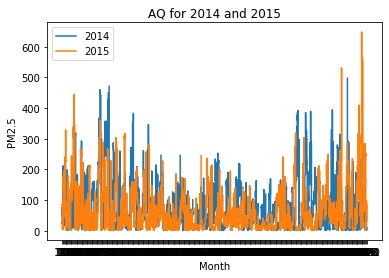

In [28]:
df_2014 = aq_data['2014'].reset_index()
df_2015 = aq_data['2015'].reset_index()
df_2014['month_day_hour'] = df_2014.apply(lambda x: str(x['month'])+"-"+x['day'],axis=1)
df_2015['month_day_hour'] = df_2015.apply(lambda x: str(x['month'])+"-"+x['day'],axis=1)
plt.plot(df_2014['month_day_hour'],df_2014['PM2.5'])
plt.plot(df_2015['month_day_hour'],df_2015['PM2.5'])
plt.legend(['2014','2015'])
plt.xlabel('Month')
plt.ylabel('PM2.5')
plt.title('AQ for 2014 and 2015')

In [29]:
aq_data['2014':'2016'][['month','PM2.5']].groupby('month').describe()

PM2.5                                                       
        count       mean         std  min   25%   50%     75%    max
month                                                               
1      2173.0  70.285274   75.913587  3.0  12.0  38.0  113.00  443.0
2      1978.0  86.389282  105.603069  3.0  10.0  33.0  132.00  881.0
3      2212.0  80.193852   87.889440  3.0  13.0  47.0  123.25  474.0
4      2105.0  67.963325   56.430235  3.0  25.0  54.0   95.00  346.0
5      2188.0  47.994378   44.843130  3.0  16.0  35.0   67.00  358.0
6      2119.0  46.655403   43.877349  3.0  13.0  31.0   69.00  245.0
7      2205.0  61.671474   50.926149  3.0  21.0  48.0   91.00  252.0
8      2206.0  41.364869   37.279312  3.0  13.0  29.0   60.00  217.0
9      2074.0  45.356123   43.235331  3.0  11.0  27.0   78.00  240.0
10     2081.0  82.586257   92.234361  3.0  13.0  43.0  124.00  414.0
11     2141.0  77.500140   71.720648  3.0  20.0  56.0  112.00  394.0
12     2186.0  87.990851  104.677021  3.0  11.0  48.5  135.00  647.0

In [30]:
aq_data['2014':'2016'][['month','PM2.5','TEMP']].groupby('month').agg({'PM2.5':['max'],'TEMP': ['min','max']})

PM2.5  TEMP      
         max   min   max
month                   
1      443.0 -16.6  12.4
2      881.0 -10.9  14.0
3      474.0  -6.4  26.0
4      346.0   1.3  32.0
5      358.0   7.0  41.4
6      245.0  15.1  38.1
7      252.0  16.8  39.2
8      217.0  16.6  36.3
9      240.0   7.8  34.5
10     414.0  -1.4  28.1
11     394.0 -10.3  20.8
12     647.0  -9.7  11.6

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001F7050C7D68>,
      dtype=object)

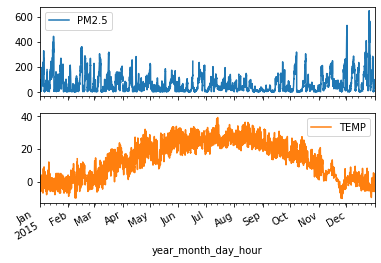

In [31]:
aq_data_2015 = aq_data['2015']
pm_data_2015 = aq_data_2015[['PM2.5','TEMP']]
pm_data_2015.plot(subplots=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F7054025F8>,
      dtype=object)

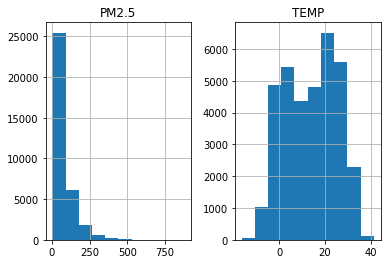

In [32]:
aq_data[['PM2.5','TEMP']].hist()

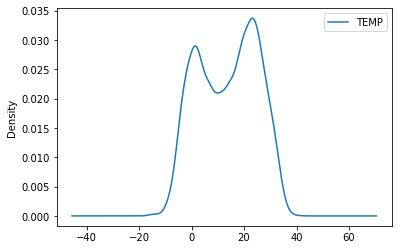

In [33]:
aq_data[['TEMP']].plot(kind='density')

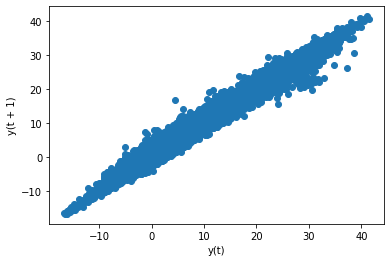

In [34]:
pd.plotting.lag_plot(aq_data['TEMP'], lag=1)

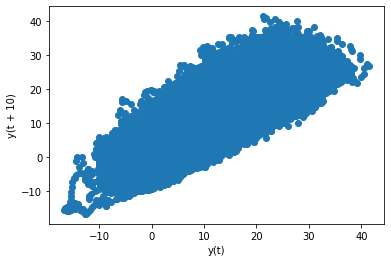

In [35]:
pd.plotting.lag_plot(aq_data['TEMP'], lag=10)

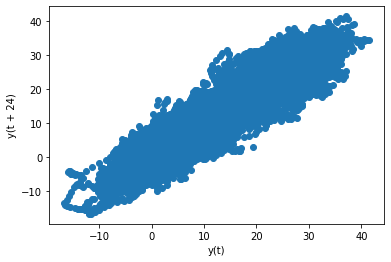

In [36]:
pd.plotting.lag_plot(aq_data['TEMP'], lag=24)

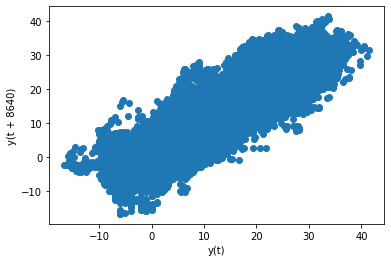

In [37]:
pd.plotting.lag_plot(aq_data['TEMP'], lag=8640)

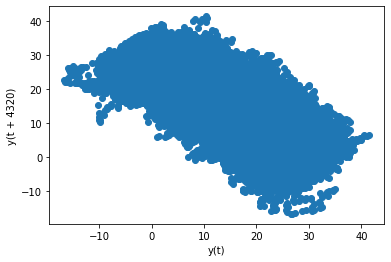

In [38]:
pd.plotting.lag_plot(aq_data['TEMP'], lag=4320)

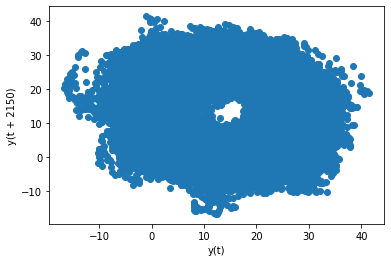

In [39]:
pd.plotting.lag_plot(aq_data['TEMP'], lag=2150)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001F70597CBE0>,
      dtype=object)

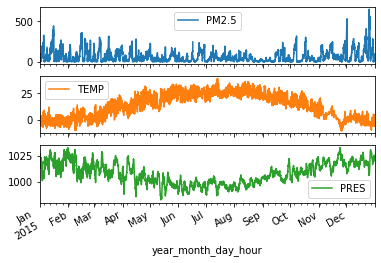

In [40]:
aq_data_2015 = aq_data['2015']
pm_data_2015 = aq_data_2015[['PM2.5','TEMP','PRES']]
pm_data_2015.plot(subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001F708F87828>,
      dtype=object)

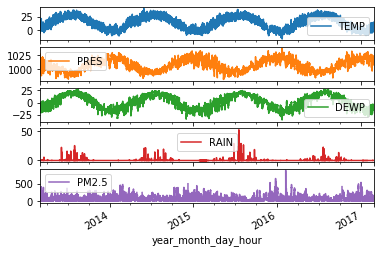

In [41]:
multi_data = aq_data[['TEMP','PRES','DEWP','RAIN','PM2.5']]
multi_data.plot(subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001F7092A33C8>,
      dtype=object)

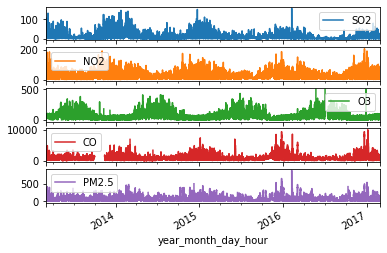

In [42]:
multi_data = aq_data[['SO2','NO2','O3','CO','PM2.5']]
multi_data.plot(subplots=True)

Text(0.5, 0, 'year_month_day_hour')

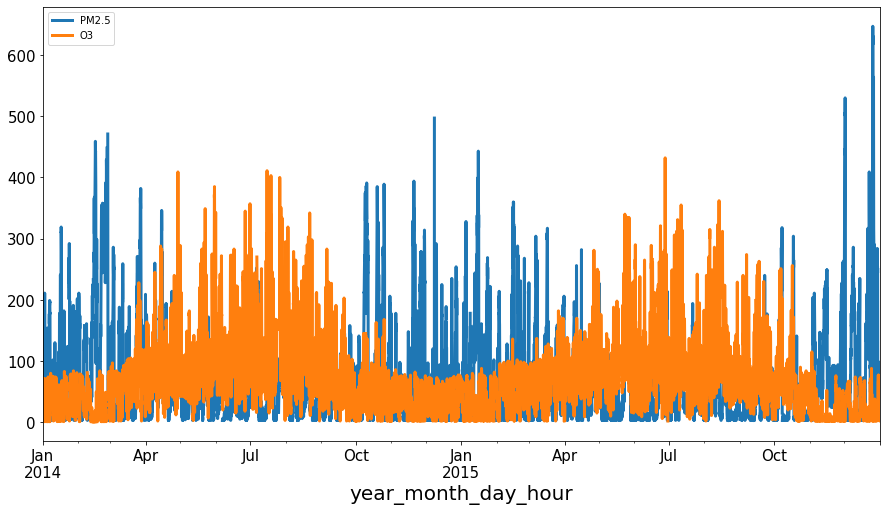

In [43]:
aq_data['2014':'2015'][['PM2.5','O3']].plot(figsize=(15,8),linewidth=3, fontsize=15)
plt.xlabel('year_month_day_hour', fontsize=20)

In [44]:
aq_data_2015 = aq_data['2015']
aq_data_2015['PM2.5'].isnull().any()

True

C:\Users\sdasgupt\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning:

invalid value encountered in greater_equal

C:\Users\sdasgupt\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning:

invalid value encountered in less_equal



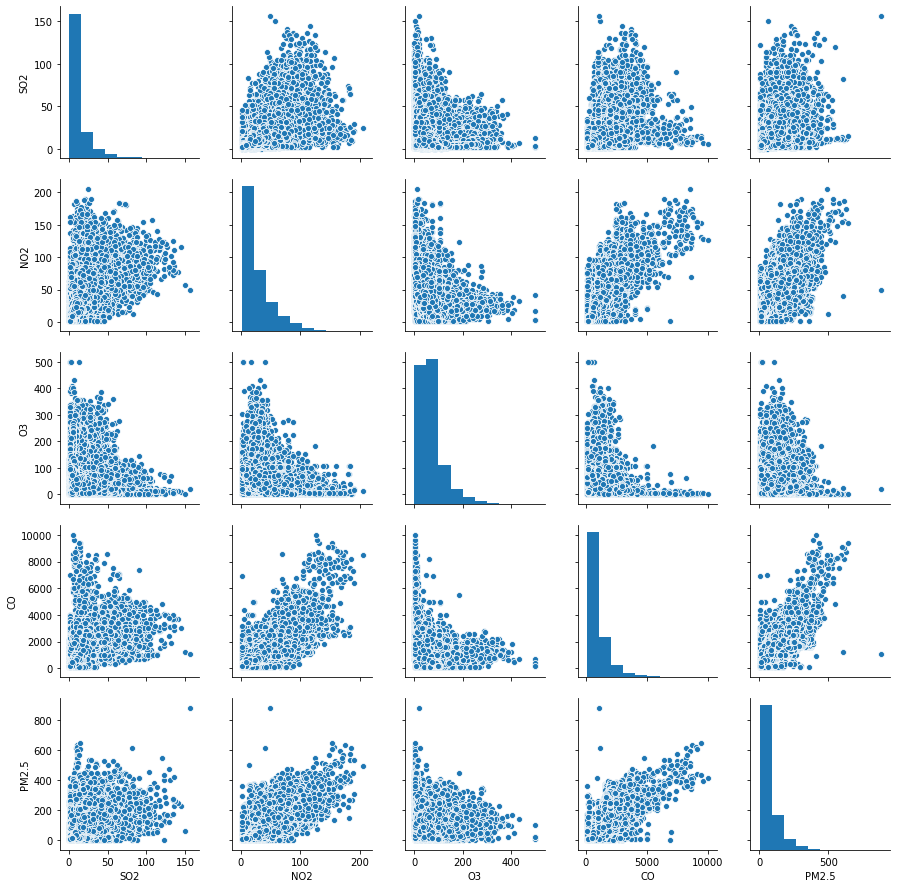

In [45]:
g = sns.pairplot(aq_data[['SO2','NO2','O3','CO','PM2.5']])

In [46]:
corr = aq_data[['SO2','NO2','O3','CO','PM2.5']].corr(method='pearson')
corr

,SO2,NO2,O3,CO,PM2.5
SO2,1.000000,0.610433,-0.182096,0.529182,0.475117
NO2,0.610433,1.000000,-0.373625,0.798753,0.718170
O3,-0.182096,-0.373625,1.000000,-0.303275,-0.100542
CO,0.529182,0.798753,-0.303275,1.000000,0.802737
PM2.5,0.475117,0.718170,-0.100542,0.802737,1.000000


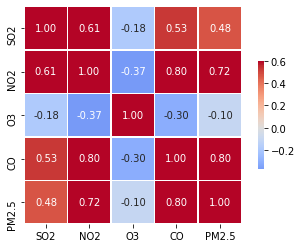

In [47]:
g = sns.heatmap(corr,vmax=0.6,center=0,square=True,linewidths=0.5,cbar_kws={'shrink':.5},annot=True,fmt='.2f',cmap='coolwarm')

In [48]:
aq_data.groupby('wd').agg(median=('PM2.5','median'),mean=('PM2.5','mean'),max=('PM2.5','max'),min=('PM2.5','min')).reset_index()

TypeError: aggregate() missing 1 required positional argument: 'arg'

In [ ]:
aq_df_na = aq_data.copy()
aq_df_na = aq_df_na.dropna()

In [ ]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'])

In [ ]:
aq_df_na['TEMP'].resample('1m').mean()

In [ ]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'].resample('1m').mean())

In [ ]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['PM2.5'].resample('1m').mean())

In [ ]:
pd.plotting.autocorrelation_plot(aq_df_na['2014':'2016']['TEMP'])